# **Dog Vision Project (Dog Breed Classification)**

In [ ]:
# !unzip "/content/drive/MyDrive/Datasets/dog_images.zip" -d "/content/drive/MyDrive/Datasets/Dog-vision-Project/"

In [ ]:
# Importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from sklearn.model_selection import train_test_split

from IPython.display import Image
import random
import datetime

import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__, hub.__version__)

2.17.0 0.16.1


In [ ]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
# Reading the labels.csv file
labels_csv = pd.read_csv("/content/drive/MyDrive/Datasets/Dog-vision-Project/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

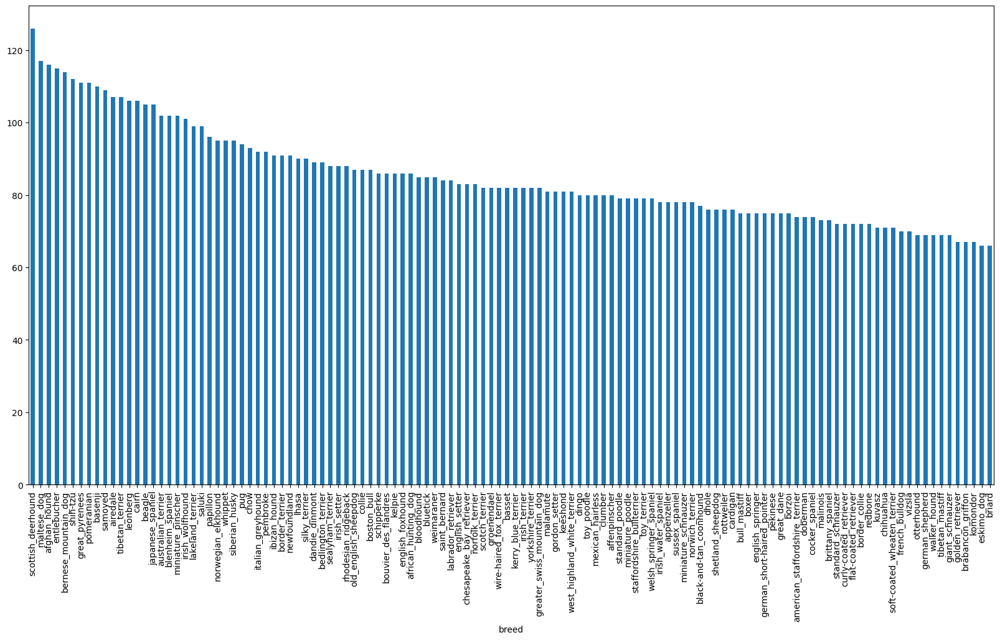

In [ ]:
# Plotting the number of occurences of different breeds
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

## Dealing with the Image ID and Breeds in the training folder

In [ ]:
# Create path names from image id
file_names = [f"drive/MyDrive/Datasets/Dog-vision-Project/train/{fname}.jpg" for fname in labels_csv['id']]
file_names[:5]

['drive/MyDrive/Datasets/Dog-vision-Project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Datasets/Dog-vision-Project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Datasets/Dog-vision-Project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Datasets/Dog-vision-Project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Datasets/Dog-vision-Project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

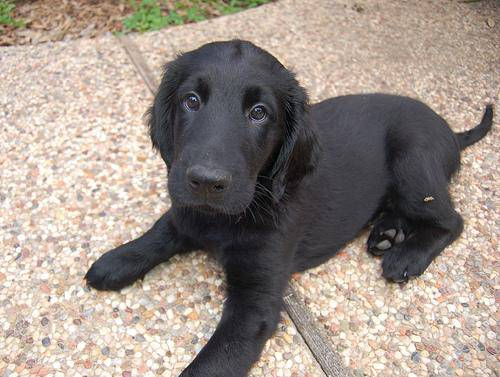

In [ ]:
Image(file_names[1009])

In [ ]:
labels_csv['breed'][1009]

'flat-coated_retriever'

In [ ]:
# Check whether the number of filenames mathces the number of actual image files
if len(os.listdir("drive/MyDrive/Datasets/Dog-vision-Project/train")) == len(file_names):
  print("Number of files match")
  print(len(os.listdir("drive/MyDrive/Datasets/Dog-vision-Project/train")))
else:
  print("Number of files do not match")

Number of files match
10222


In [ ]:
# Preparing our labels
labels = labels_csv['breed'].to_numpy()
labels[:5]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [ ]:
# See if the number of labels matches number of filenames
if len(labels) == len(file_names):
  print("Number of labels match")
else:
  print("Number of labels do not match")

Number of labels match


In [ ]:
# Checking out the unique breeds
unique_labels = np.unique(labels)
unique_labels, len(unique_labels)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Creating boolean labels
boolean_labels = [label == unique_labels for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Creating a list of pairs of file_names and boolean_labels
paired_data = list(zip(file_names, boolean_labels))
paired_data[:2]

[('drive/MyDrive/Datasets/Dog-vision-Project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, Fa

In [ ]:
# Shuffling the pairs
random.shuffle(paired_data)
file_names, boolean_labels = zip(*paired_data)
file_names[:2], boolean_labels[:2]

(('drive/MyDrive/Datasets/Dog-vision-Project/train/c9225fdea1d82387cd5b8bcf30ed9df5.jpg',
  'drive/MyDrive/Datasets/Dog-vision-Project/train/b3beb6bab59975305146110d51fc7120.jpg'),
 (array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False,  True, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, Fals

## Making a Validation Set

In [ ]:
X = file_names
y = boolean_labels

In [ ]:
# Experimenting with a small portion of the data
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 500}

In [ ]:
# Splitting the data into train and validation sets using train_test_split from sklearn
X_train, X_val, y_train, y_val = train_test_split(file_names[:NUM_IMAGES], boolean_labels[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Making Tensors

In [ ]:
# Create a function for preprocessing images
ING_SIZE = 224
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)    # read in an image file
    image = tf.image.decode_jpeg(image, channels=3)    # turn the jpeg image into numerical tensor with 3 color channels (RGB)
    image = tf.image.resize(image, (ING_SIZE, ING_SIZE))    # resize the image to desired value
    image /= 255.0    # divide the vector by 255.0 (a float) this is esentially the same as using tf.image.convert_image_dtype(image, tf.float32)
    return image

In [ ]:
img = preprocess_image(X_train[0])
img.shape

TensorShape([224, 224, 3])

In [ ]:
img[:2]

<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
array([[[0.9440602 , 0.97947687, 0.94258964],
        [0.9533165 , 0.970841  , 0.89703965],
        [0.9904833 , 0.98415285, 0.8665824 ],
        ...,
        [0.7983954 , 0.79055226, 0.59504825],
        [0.7921798 , 0.78732765, 0.5783548 ],
        [0.8052198 , 0.80129826, 0.5838963 ]],

       [[0.9779948 , 0.9893421 , 0.9100299 ],
        [0.91772366, 0.9051815 , 0.7913335 ],
        [0.9978937 , 0.9731235 , 0.80535   ],
        ...,
        [0.7716682 , 0.76248085, 0.57766545],
        [0.85302544, 0.84579504, 0.6495404 ],
        [0.7980507 , 0.79412913, 0.5814836 ]]], dtype=float32)>

## Making Batches

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
    image = preprocess_image(image_path)
    return image, label

In [ ]:
img, lbl = get_image_label(X_train[0], tf.constant(y_train[0]))
img[:2], lbl

(<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
 array([[[0.9440602 , 0.97947687, 0.94258964],
         [0.9533165 , 0.970841  , 0.89703965],
         [0.9904833 , 0.98415285, 0.8665824 ],
         ...,
         [0.7983954 , 0.79055226, 0.59504825],
         [0.7921798 , 0.78732765, 0.5783548 ],
         [0.8052198 , 0.80129826, 0.5838963 ]],
 
        [[0.9779948 , 0.9893421 , 0.9100299 ],
         [0.91772366, 0.9051815 , 0.7913335 ],
         [0.9978937 , 0.9731235 , 0.80535   ],
         ...,
         [0.7716682 , 0.76248085, 0.57766545],
         [0.85302544, 0.84579504, 0.6495404 ],
         [0.7980507 , 0.79412913, 0.5814836 ]]], dtype=float32)>,
 <tf.Tensor: shape=(120,), dtype=bool, numpy=
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
  

In [ ]:
BATCH_SIZE = 32 #@param {type: "integer"}

In [ ]:
def creat_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
        print("Creating testing data")
        test_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
        test_dataset = test_dataset.map(preprocess_image).batch(batch_size)
        return test_dataset
    elif valid_data:
        print("Creating validation data")
        val_dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        val_dataset = val_dataset.map(get_image_label).batch(batch_size)
        return val_dataset
    else:
        print("Creating training data")
        dataset = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
        dataset = dataset.shuffle(buffer_size=len(X))
        dataset = dataset.map(get_image_label).batch(batch_size)
        return dataset

In [ ]:
train_data = creat_batches(X_train, y_train)
val_data = creat_batches(X_val, y_val, valid_data=True)

Creating training data
Creating validation data


In [ ]:
train_data, val_data

(<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [ ]:
len(train_data), len(val_data)

(25, 7)

## Visualizing Batches

In [ ]:
# Displays plot of 25 images and their labels
def show_batch(image_batch, label_batch):
    plt.figure(figsize=(20, 20))
    for n in range(32):
        ax = plt.subplot(8, 4, n+1)
        plt.imshow(image_batch[n])
        plt.title(unique_labels[label_batch[n].argmax()])
        plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images.shape, train_labels.shape

((32, 224, 224, 3), (32, 120))

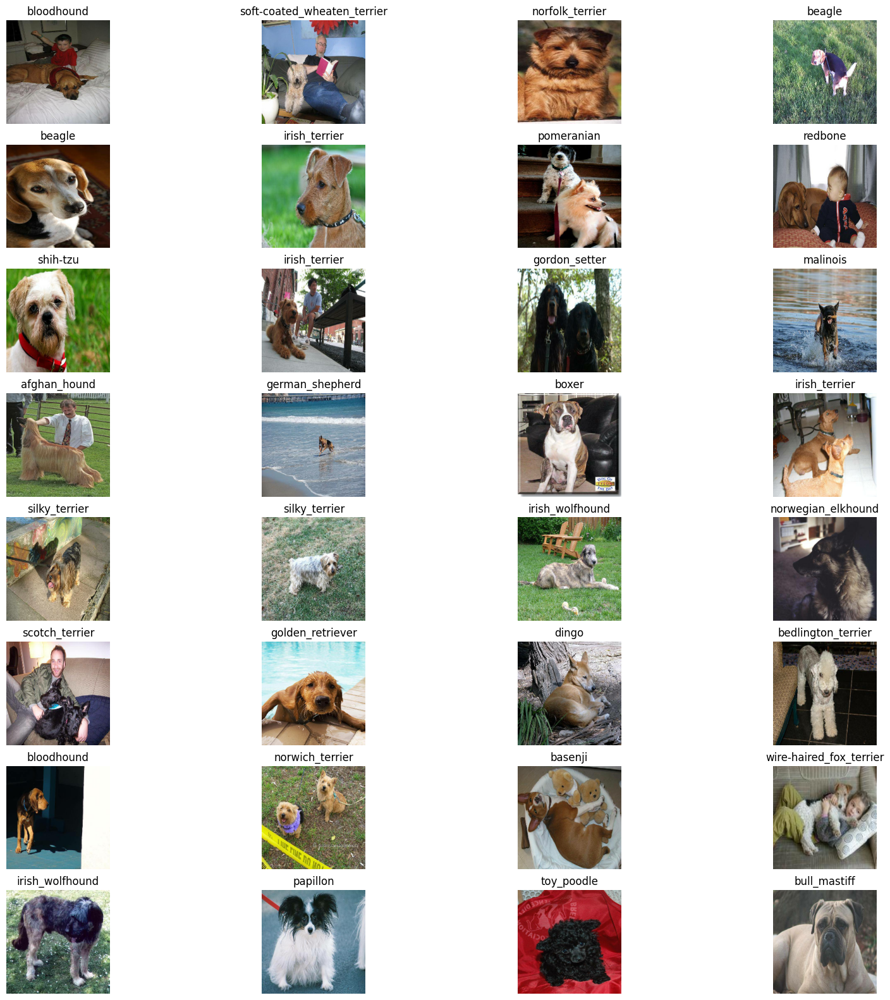

In [ ]:
show_batch(train_images, train_labels)

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images.shape, val_labels.shape

((32, 224, 224, 3), (32, 120))

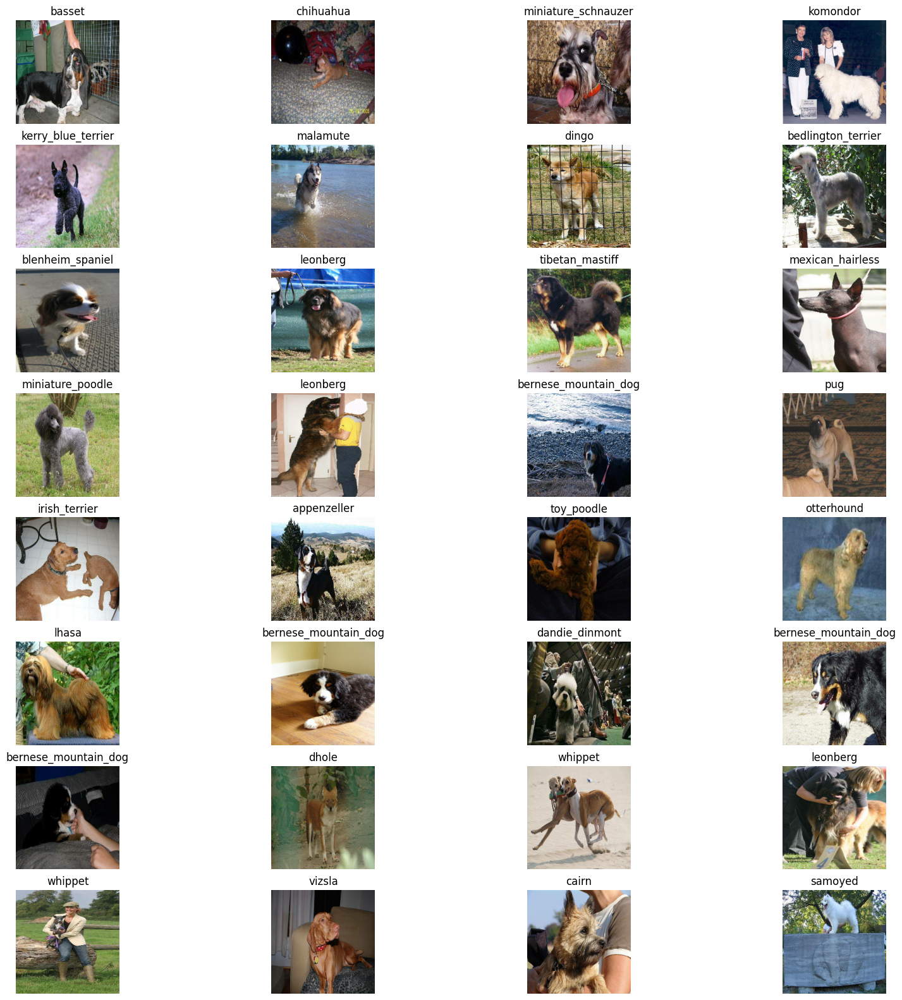

In [ ]:
show_batch(val_images, val_labels)

## Building a Model

In [ ]:
INPUT_SHAPE = [None, ING_SIZE, ING_SIZE, 3]
OUTPUT_SHAPE = len(unique_labels)
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", MODEL_URL)

    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Lambda(lambda x: hub.KerasLayer(model_url, trainable=False)(x)))
    model.add(tf.keras.layers.Dense(units=output_shape,activation="softmax"))

    model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss=tf.keras.losses.CategoricalCrossentropy(),
                  metrics=["accuracy"])

    model.build(input_shape=input_shape)
    model.summary()

    return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## TensorBoard Callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
def create_tensorboard_callback():
    log_dir = os.path.join("/content/drive/MyDrive/Datasets/Dog-vision-Project/logs",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
    print(f"Saving TensorBoard log files to: {log_dir}")
    return tensorboard_callback

## Early Stopping Callback

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3, min_delta=0.001)

## Training Our Model

In [ ]:
NUM_EPOCHS = 20 #@param {type: "slider", min: 10, max: 100, step: 10}

In [ ]:
def train_model():
    model = create_model()
    tensorboard = create_tensorboard_callback()
    model.fit(train_data,
              epochs=NUM_EPOCHS, #steps_per_epoch=int(0.15 * len(train_data)),
              validation_data=val_data,
              validation_freq=1, #validation_steps=int(0.15 * len(val_data)),
              callbacks=[tensorboard, early_stopping])
    return model


In [ ]:
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_1 (Lambda)                    │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

Saving TensorBoard log files to: /content/drive/MyDrive/Datasets/Dog-vision-Project/logs/20240924-104611
Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 189s 7s/step - accuracy: 0.0454 - loss: 5.0927 - val_accuracy: 0.3100 - val_loss: 3.1985
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 26s 141ms/step - accuracy: 0.6489 - loss: 1.8113 - val_accuracy: 0.5350 - val_loss: 2.0527
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 213ms/step - accuracy: 0.9463 - loss: 0.5556 - val_accuracy: 0.6150 - val_loss: 1.6768
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - accuracy: 0.9959 - loss: 0.2550 - val_accuracy: 0.6250 - val_loss: 1.5690
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 202ms/step - accuracy: 1.0000 - loss: 0.1461 - val_accuracy: 0.6300 - val_loss: 1.5284
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 140ms/step - accuracy: 1.0000 - loss: 0.0968 - val_accuracy: 0.6400 - val_loss: 1.4980
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - accuracy: 1.0000 - loss: 0.0722 - val_accuracy: 0.6400 - val_loss: 1.4697

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Datasets/Dog-vision-Project/logs

<IPython.core.display.Javascript object>

## Making and Evaluating Predictions using our model

In [ ]:
predictions = model.predict(val_data, verbose=1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 676ms/step


In [ ]:
predictions.shape

(200, 120)

In [ ]:
index = 1
print(predictions[index])
print(f"Max value {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_labels[predictions[index].argmax()]}")

[1.92938576e-04 1.69668603e-03 3.81986669e-04 4.38041613e-03
 1.42647652e-03 1.19322236e-03 9.79617937e-04 5.77767892e-03
 8.21252062e-04 8.86840571e-04 1.34909773e-04 7.89046520e-04
 7.16132490e-06 5.83464222e-04 6.38024241e-04 5.05961129e-04
 3.40433413e-04 3.63428332e-03 2.37413569e-05 2.02767551e-03
 2.35564203e-05 2.66970741e-03 1.81415915e-01 1.26241239e-05
 3.52467905e-05 4.21181843e-02 2.92513396e-05 6.46494515e-03
 1.58318901e-03 2.75342749e-03 3.78655456e-03 4.52215597e-03
 7.66541634e-05 3.50754592e-04 1.04834971e-05 2.73488316e-04
 1.27995841e-03 3.74669144e-05 1.05222061e-04 5.70784905e-05
 1.30306289e-04 2.69867924e-05 3.62230022e-03 2.22349590e-05
 1.04469003e-03 1.17589915e-02 4.94838133e-03 1.75434921e-03
 1.86459420e-06 4.49179485e-03 4.19330830e-03 4.87545840e-05
 7.75677545e-05 2.02193842e-05 2.86265705e-02 1.83817314e-03
 1.23442069e-03 9.29150358e-02 2.15028213e-05 7.65094417e-04
 2.75470335e-02 3.71615024e-04 6.54936885e-05 1.50864366e-02
 4.03854301e-06 5.845446

In [ ]:
def unbatchify(data):
    images = []
    labels = []
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_labels[np.argmax(label)])
    return images, labels

def get_pred_label(prediction_probabilities):
    return unique_labels[np.argmax(prediction_probabilities)]

In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.15879656, 0.19801225, 0.1666397 ],
         [0.12951227, 0.16872795, 0.1373554 ],
         [0.09569444, 0.13491014, 0.10353758],
         ...,
         [0.10414278, 0.10806435, 0.07732201],
         [0.08565167, 0.09468535, 0.08411118],
         [0.05600552, 0.07169179, 0.06777022]],
 
        [[0.12217332, 0.16138901, 0.1260949 ],
         [0.10948458, 0.14870027, 0.11340614],
         [0.17200631, 0.21122201, 0.17592788],
         ...,
         [0.16065495, 0.16457652, 0.13383418],
         [0.23215975, 0.24119343, 0.23061927],
         [0.20362462, 0.2193109 , 0.21538933]],
 
        [[0.14370218, 0.18291786, 0.14762375],
         [0.1378396 , 0.17705528, 0.14176117],
         [0.15041728, 0.18963297, 0.15433885],
         ...,
         [0.13642032, 0.1403419 , 0.10959956],
         [0.12249061, 0.13193221, 0.11557548],
         [0.09167608, 0.11004968, 0.09806614]],
 
        ...,
 
        [[0.21339163, 0.20947006, 0.19378379],
         [0.20251057, 0.20643213, 0.18682

In [ ]:
get_pred_label(val_labels[81]), get_pred_label(predictions[81])

('affenpinscher', 'cardigan')

In [ ]:
get_pred_label(val_labels[0]), get_pred_label(predictions[0])

('affenpinscher', 'basset')

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
    pred_label = get_pred_label(pred_prob)

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    color = "green" if pred_label == true_label else "red"
    plt.title(f"{pred_label} {np.max(pred_prob)*100:.2f} ({true_label})", color=color)
    plt.axis(False)

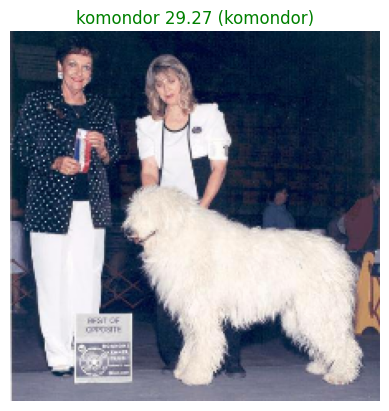

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=3)

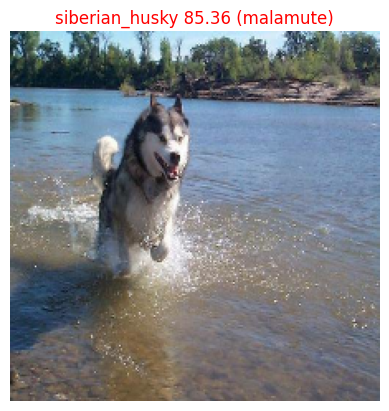

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=5)